In [1]:
'''
Mask Generation Notebook
- modified to use GPU acceleration
- by Arun Chakravorty (< Lex)
- 12/8/21 
'''

'\nMask Generation Notebook\n- modified to use GPU acceleration\n- by Arun Chakravorty (< Lex)\n- 12/8/21 \n'

In [2]:
#Install Cellpose Models

import numpy as np
import time, os, sys, random
from urllib.parse import urlparse
import skimage.io
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib as mpl
import glob
%matplotlib inline
import re
from util import pil_imread
mpl.rcParams['figure.dpi'] = 300

from urllib.parse import urlparse
import shutil

print ("Downloading Models")
from cellpose import models

#https://stackoverflow.com/questions/8924173/how-do-i-print-bold-text-in-python
BOLD = '\033[1m'
UNDERLINE = '\033[4m'
END = '\033[0m'

2021-12-10 10:35:00,056 [INFO] WRITING LOG OUTPUT TO /home/kcolon/.cellpose/run.log


In [3]:
#Check if colab notebook instance has GPU access
if models.use_gpu() == False: 
  #Warnings from the ZeroCost StarDist notebook
    print(BOLD+UNDERLINE+'You do not have GPU access.'+END)
    print('Make sure that you asked for GPU access in the OnDemand Instance') 
    print('Expect slow performance. To access GPU try reconnecting later')
    use_GPU=False
else:
    print(BOLD+UNDERLINE+"You have access to the GPU."+END+"\nDetails are:")
    print("*************************************************")
    # Nvidia GPU specs: 
    !nvidia-smi
    use_GPU=True

print("*************************************************")
print("Libraries imported and configured")

2021-12-10 10:35:00,298 [INFO] TORCH CUDA version not installed/working.
You do not have GPU access.
Make sure that you asked for GPU access in the OnDemand Instance
Expect slow performance. To access GPU try reconnecting later
*************************************************
Libraries imported and configured


In [4]:
import plotly.express as px

def plot_2d(img, zmax):
    """Function to generate plots with slide panel
    Parameters:
    -----------
    img = image containing ref and corrected
    zmax= set maximum intensity"""
    
    #For Plotting 2d image
    #-------------------------------------------
    fig = px.imshow(
        img,
        width=600,
        height=600,
        binary_string=True,
        binary_compression_level=4,
        binary_backend='pil',
        zmax = zmax)
    
    fig.show()

In [5]:
def plot_slideshow(img, zmax):
    """Function to generate plots with slide panel
    Parameters:
    -----------
    img = image containing ref and corrected
    zmax= set maximum intensity"""
    
    #For Plotting 2d image
    #-------------------------------------------
    fig = px.imshow(
        img,
        width=600,
        height=600,
        binary_string=True,
        binary_compression_level=4,
        animation_frame=0,
        binary_backend='pil',
        zmax = zmax)
    
    fig.show()

In [8]:
# Load the images: 
input_directory = "/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/dapi_aligned/segmentation/*.tif"
files=glob.glob(input_directory)

In [9]:
len(files)

108

In [10]:
# Append the Images into one image. ""
imgs = []

for i in tqdm(range(len(files))):
    imgs.append(pil_imread(files[i], swapaxes=True))

100%|██████████| 108/108 [00:14<00:00,  7.21it/s]


In [11]:
#Z, C, X, Y 
imgs[0].shape

(2, 2, 2048, 2048)

## View Single File

In [13]:
img = np.swapaxes(imgs[0],0,1)
#Taking max projection of the Cytoplasmic and Nuclear Channel
maxc = np.max(img[0], axis=0)
maxn = np.max(img[1],axis=0)

In [14]:
max_cell = np.array([maxc,maxn])


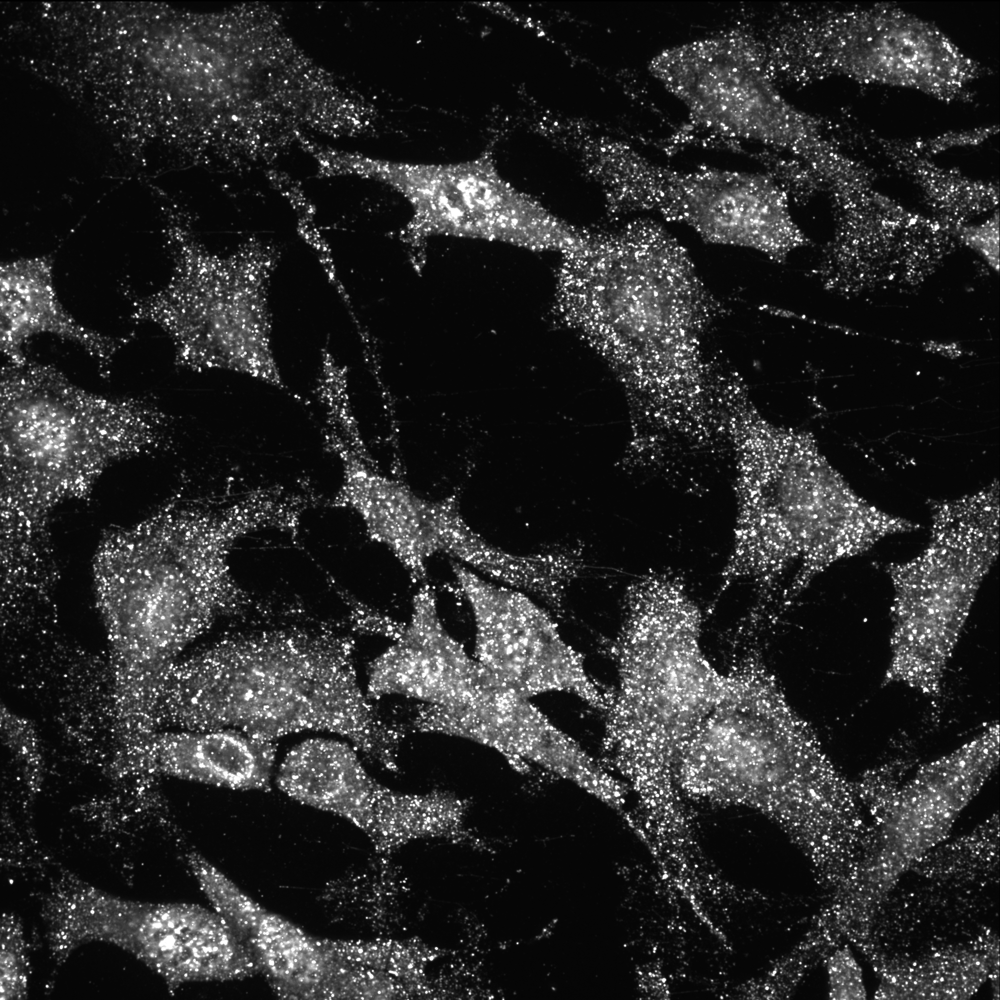

In [18]:
# Cytoplasmic Channel
plot_2d(max_cell[0], zmax=5000)


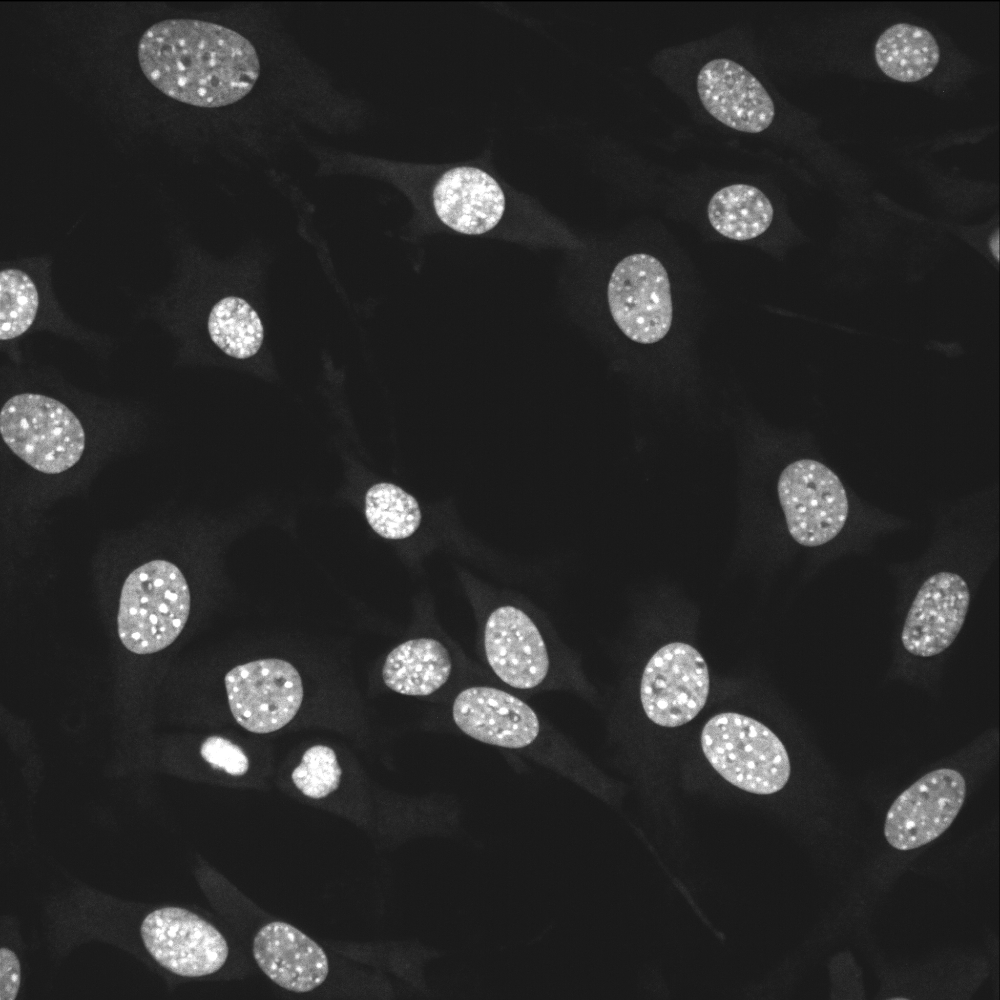

In [17]:
# Nuclear Channel
plot_2d(max_cell[1], zmax=1000)

## Settings for Cellpose

In [77]:
Model_Choice = "Nucleus" #["Cytoplasm", "Nucleus"]
model_choice=Model_Choice
Channel_for_segmentation="1" #[0,1,2,3]
segment_channel=int(Channel_for_segmentation)

if model_choice=="Cytoplasm":
    model_type="cyto"
else:
    model_type="nuclei"

###If you choose cytoplasm, set True you have a nuclear channel
Use_nuclear_channel= True #{type:"boolean"}
Nuclear_channel="1" #[1,2,3]
nuclear_channel=int(Nuclear_channel)

#For debugging. Don't need to change anything since we check whether models have GPU access in an earlier cell.  
#Use_GPU = True #{type:"boolean"}
#use_GPU=Use_GPU

### Diameter of cell (pixels):
#### Enter 0 if you don't know and cellpose will estimate it automatically. You can define this later as well.
Diameter =  100 #{type:"number"}
diameter=Diameter

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus
# or if you have different types of channels in each image
#channels = [[2,3], [0,0], [0,0]]

# channels = [cytoplasm, nucleus]
if model_choice == "Cytoplasm":
    if Use_nuclear_channel:
        channels=[segment_channel,nuclear_channel]
    else:
        channels=[segment_channel,0]

if model_choice == "Nucleus":
    channels=[segment_channel,0]


# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type=model_type)

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended) 
# diameter can be a list or a single number for all images
if diameter == 0:
    diameter = None
    print("Diameter is set to None. The size of the cells will be estimated on a per image basis")

2021-12-10 12:00:59,972 [INFO] >>>> using CPU


### Test Cellpose on a Single Image
The ***Flow_threshold parameter*** is  the  maximum  allowed  error  of  the  flows  for  each  mask.   The  default  is 0.4. 

*   **Increase** this threshold if cellpose is not returning as many masks as you’d expect

*   **Decrease** this threshold if cellpose is returning too many ill-shaped masks. 

The ***Cell Probability Threshold*** determines proability that a detected object is a cell.   The  default  is 0.0. 

*   **Decrease** this threshold if cellpose is not returning as many masks as you’d expect or if masks are too small

*   **Increase** this threshold if cellpose is returning too many masks esp from dull/dim areas. 

In [80]:
# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3

# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0

# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
#channels = [[2,3], [0,0], [0,0]]


channels = [0,0]

masks, flows, styles, diams = model.eval(max_cell[1], diameter=100, 
                                         channels=channels, flow_threshold=2 ,cellprob_threshold=-3)


2021-12-10 12:01:33,752 [INFO] ~~~ FINDING MASKS ~~~
2021-12-10 12:01:38,518 [INFO] >>>> TOTAL TIME 4.77 sec


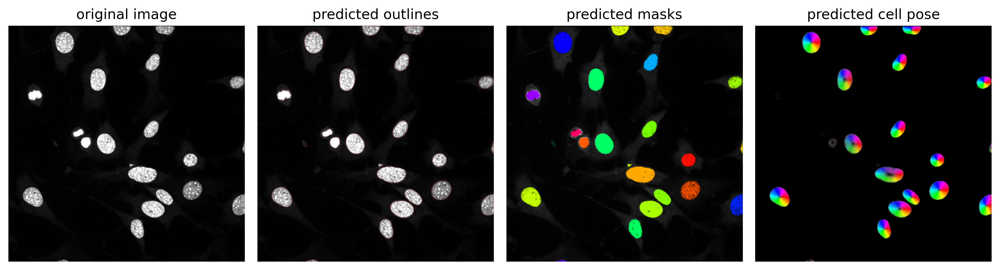

In [82]:
from cellpose import plot

fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, max_cell[1], masks, flows[0], channels=channels)
plt.tight_layout()
plt.show()

### Run Cellpose on Entire Directory 

In [87]:
imgs_final = []

for i in tqdm(range(len(imgs))):
    img = np.swapaxes(imgs[i],0,1)
    #maxc = np.max(img[0], axis=0)
    maxn = np.max(img[1],axis=0)
    #max_cell = np.array([maxc,maxn])
    imgs_final.append(maxn)

100%|██████████| 108/108 [00:00<00:00, 132.68it/s]


In [88]:
masks, flows, styles, diams = model.eval(imgs_final, diameter=100, channels=channels, 
                                         flow_threshold=2 ,cellprob_threshold=-3)

2021-12-10 12:24:40,090 [INFO] ~~~ FINDING MASKS ~~~
2021-12-10 12:32:44,107 [INFO] 95%|#########5| 103/108 [08:04<00:24,  4.89s/it]


2021-12-10 12:33:08,948 [INFO] 100%|##########| 108/108 [08:28<00:00,  4.71s/it]
2021-12-10 12:33:08,950 [INFO] >>>> TOTAL TIME 508.86 sec


### Show Results 

In [89]:
masks

[array([[ 0,  0,  0, ...,  0,  0,  0],
        [ 0,  0,  0, ...,  0,  0,  0],
        [ 0,  0,  0, ...,  0,  0,  0],
        ...,
        [26, 26, 26, ...,  0,  0,  0],
        [26, 26, 26, ...,  0,  0,  0],
        [26, 26, 26, ...,  0,  0,  0]], dtype=uint16),
 array([[2, 2, 2, ..., 0, 0, 0],
        [2, 2, 2, ..., 0, 0, 0],
        [2, 2, 2, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint16),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint16),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint16),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 

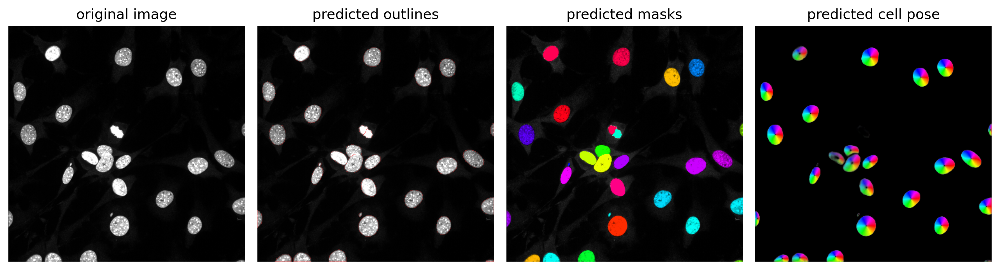

In [94]:
image_number = 9

img1=imgs_final[image_number]
#if img1.dtype!='uint8':
#    img1=img_as_ubyte(img1)

fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, img1, masks[image_number], flows[image_number][0], channels=channels)
plt.tight_layout()
plt.show()

### Save Files 

In [98]:
# Do you want to save the flow?
Save_Flow= False #{type:"boolean"}
##### *Flow image will be resized when saved
save_flow= Save_Flow

save_dir = '/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/nuclear_masks/'

#save images in folder with the diameter value used in cellpose
print("Segmentation Done. Saving Masks and flows now")
print("Save Directory is: ",save_dir)
if (not os.path.exists(save_dir)):
    os.mkdir(save_dir)

if save_flow:
    print("Saving Flow")
    flows_save_dir=save_dir+"flows"+os.sep
    print("Save Directory for flows is: ",flows_save_dir)
    if (not os.path.exists(flows_save_dir)):
        os.mkdir(flows_save_dir)


for idx,mask in enumerate(masks):
    file_name=os.path.splitext(os.path.basename(files[idx]))[0]
    #Output name for masks
    mask_output_name=save_dir+file_name+".tif"
    #Save mask as 16-bit in case this has to be used for detecting than 255 objects
    mask=mask.astype(np.uint16)
    #Save flow as 8-bit
    skimage.io.imsave(mask_output_name,mask, check_contrast=False)
    if save_flow:
        #Output name for flows
        flow_output_name=flows_save_dir+"FLOWS_"+file_name+".tif"
        #Save as 8-bit
        flow_image=flows[idx][0].astype(np.uint8)
        skimage.io.imsave(flow_output_name,flow_image, check_contrast=False)

print("Files saved")

Segmentation Done. Saving Masks and flows now
Save Directory is:  /groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/nuclear_masks/
Files saved


# Match masks

In [100]:
#read in masks
nuc_paths = glob.glob("/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/nuclear_masks/*.tif")
cyto_paths = glob.glob("/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/*.tif")

#organize files numerically
key = [int(re.search('MMStack_Pos(\\d+)', f).group(1)) for f in nuc_paths]
nuc_paths = list(np.array(nuc_paths)[np.argsort(key)])

key = [int(re.search('MMStack_Pos(\\d+)', f).group(1)) for f in cyto_paths]
cyto_paths = list(np.array(cyto_paths)[np.argsort(key)])

In [102]:
cyto_paths

['/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/MMStack_Pos0.ome.tif',
 '/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/MMStack_Pos1.ome.tif',
 '/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/MMStack_Pos2.ome.tif',
 '/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/MMStack_Pos3.ome.tif',
 '/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/MMStack_Pos4.ome.tif',
 '/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/MMStack_Pos5.ome.tif',
 '/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/MMStack_Pos6.ome.tif',
 '/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/MMStack_Pos7.ome.tif',
 '/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/labeled_images/MMStack_Pos8.ome.tif',
 '/groups/CaiLab/personal/Le

In [103]:
 nuclear = []
cyto = []
for i in tqdm(range(len(nuc_paths))):
    nuclear.append(pil_imread(nuc_paths[i]))
    cyto.append(pil_imread(cyto_paths[i]))

100%|██████████| 108/108 [00:12<00:00,  8.85it/s]


In [109]:
from importlib import reload
import nuclear_cyto_match as ncm

In [110]:
reload(ncm)

<module 'nuclear_cyto_match' from '/central/groups/CaiLab/personal/Lex/raw/112221_20kdash_3t3/notebook_pyfiles/mask_generation_files/nuclear_cyto_match.py'>

In [111]:
cyto_new = ncm.nuclear_cyto_matching(cyto,nuclear, threshold=0.10)

100%|██████████| 108/108 [05:51<00:00,  3.25s/it]


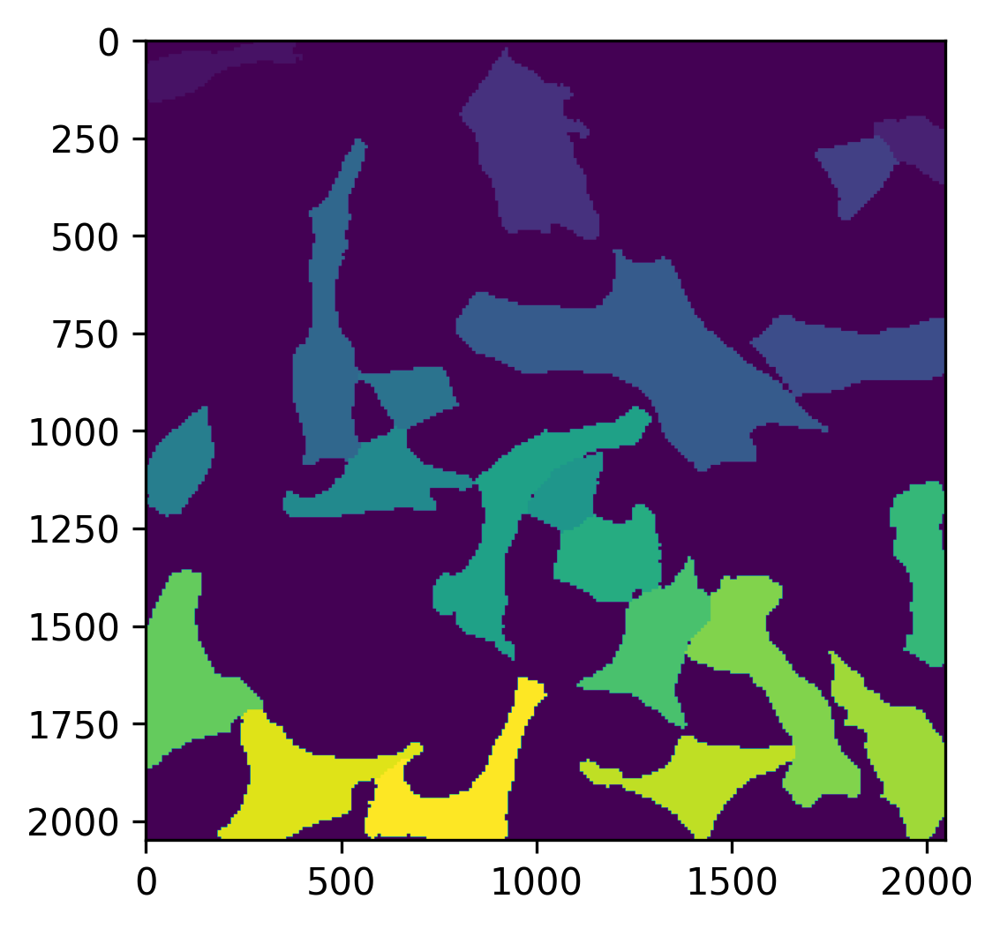

In [113]:
plt.imshow(cyto_new[0])

In [117]:
import tifffile as tf
i=0
for lab_img in cyto_new:
    tf.imwrite(f"../labeled_images/matched/MMStack_Pos{i}.tif",lab_img)
    i += 1